# Correctly pass the input to the trained model

E.g., don't forget to add the speed and command. Let's grab a specific random sample from the dataset:

In [155]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from network.models.architectures.CIL_multiview.CIL_vit import CIL_vit
import os
import json
from configs import g_conf, set_type_of_process, merge_with_yaml

exp_batch = 'CIL_ViT'
exp_name = 'CILvit_3cam_vitb32_Town01Full_bs256_fPE_wmupcdown_lr1e4_scrACT_noCLS_outMLP_randaugs+colorjitter'

In [156]:
merge_with_yaml(os.path.join('configs', exp_batch, f'{exp_name}.yaml'))
g_conf.PROCESS_NAME = 'train_val'
g_conf.DATASET_PATH = '/datatmp/Datasets/yixiao/CARLA'

os.environ['DATASET_PATH'] = g_conf.DATASET_PATH

model = CIL_vit(g_conf.MODEL_CONFIGURATION)

Randomly initializing the acceleration ([ACC]) and steering ([STR]) tokens...
Removing the [CLS] token from the sequence...


In [157]:
model

CIL_vit(
  (encoder_embedding_perception): VisionTransformer(
    (conv_proj): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (linear_1): Linear(in_features=768, out_features=3072, bias=True)
            (act): GELU()
            (dropout_1): Dropout(p=0.0, inplace=False)
            (linear_2): Linear(in_features=3072, out_features=768, bias=True)
            (dropout_2): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_layer_1): En

## Load the checkpoint

In [158]:
from _utils.training_utils import check_saved_checkpoints

latest_checkpoint = check_saved_checkpoints(
    os.path.join('/run/user/1001/gvfs/sftp:host=158.109.8.151,port=22345/datafast/experiments/dporres/VisionTFM/',
                 '_results', g_conf.EXPERIMENT_BATCH_NAME, g_conf.EXPERIMENT_NAME, 'checkpoints'))

In [159]:
latest_checkpoint

'/run/user/1001/gvfs/sftp:host=158.109.8.151,port=22345/datafast/experiments/dporres/VisionTFM/_results/CIL_ViT/CILvit_3cam_vitb32_Town01Full_bs256_fPE_wmupcdown_lr1e4_scrACT_noCLS_outMLP_randaugs+colorjitter/checkpoints/CIL_vit_80_165476.pth'

In [160]:
import torch

checkpoint = torch.load(latest_checkpoint)

checkpoint['model']

OrderedDict([('_model.tfx_accel_token',
              tensor([[[ 3.6759e-02,  8.6548e-03,  1.5464e-02, -1.3666e-02, -4.3719e-02,
                         1.6940e-02,  4.1386e-03,  2.4479e-02,  4.3837e-02, -3.2567e-02,
                        -2.0154e-02, -1.8326e-02, -6.8575e-02, -1.7696e-02,  4.1563e-02,
                         1.5407e-02, -7.7765e-03, -5.0020e-02,  1.0291e-02, -5.5541e-02,
                        -1.3504e-03,  1.0160e-02,  4.7654e-03, -1.5911e-02, -7.4127e-03,
                         1.1184e-02,  1.2842e-02,  2.4876e-02,  1.6953e-02, -1.8772e-03,
                        -7.7619e-03, -7.6152e-03, -1.3770e-03, -3.4158e-02, -2.2303e-02,
                         3.0567e-02, -1.6429e-02, -9.8363e-03, -2.2815e-02,  1.9141e-02,
                        -2.3173e-02, -3.4574e-03, -2.0690e-03, -1.2048e-02,  6.6101e-03,
                         4.7131e-02,  8.5363e-03, -1.2101e-02,  2.7218e-02, -2.0045e-02,
                        -1.1353e-03,  3.3063e-02,  2.1709e-02,  2.4355

In [161]:
# As we can see, the keys have _model at the beginning; let's remove it
new_state_dict = {}
for k, v in checkpoint['model'].items():
    new_state_dict[k[7:]] = v

new_state_dict

{'tfx_accel_token': tensor([[[ 3.6759e-02,  8.6548e-03,  1.5464e-02, -1.3666e-02, -4.3719e-02,
            1.6940e-02,  4.1386e-03,  2.4479e-02,  4.3837e-02, -3.2567e-02,
           -2.0154e-02, -1.8326e-02, -6.8575e-02, -1.7696e-02,  4.1563e-02,
            1.5407e-02, -7.7765e-03, -5.0020e-02,  1.0291e-02, -5.5541e-02,
           -1.3504e-03,  1.0160e-02,  4.7654e-03, -1.5911e-02, -7.4127e-03,
            1.1184e-02,  1.2842e-02,  2.4876e-02,  1.6953e-02, -1.8772e-03,
           -7.7619e-03, -7.6152e-03, -1.3770e-03, -3.4158e-02, -2.2303e-02,
            3.0567e-02, -1.6429e-02, -9.8363e-03, -2.2815e-02,  1.9141e-02,
           -2.3173e-02, -3.4574e-03, -2.0690e-03, -1.2048e-02,  6.6101e-03,
            4.7131e-02,  8.5363e-03, -1.2101e-02,  2.7218e-02, -2.0045e-02,
           -1.1353e-03,  3.3063e-02,  2.1709e-02,  2.4355e-03,  3.2126e-02,
           -2.7805e-02,  1.8568e-02, -2.8275e-02, -4.7942e-03, -1.3932e-02,
            2.0390e-02, -3.2973e-02,  8.5650e-03,  1.6905e-02, -2.458

In [162]:
from typing import OrderedDict

new_state_dict = OrderedDict(new_state_dict)

In [163]:
model.load_state_dict(new_state_dict)

<All keys matched successfully>

## Get the pure Attention Maps

In [164]:
image_size = model.image_height
patch_size = model.tfx_patch_size
hidden_dim = model.tfx_hidden_dim

(300, 300)


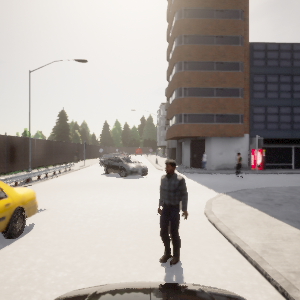

In [165]:
import torchvision
from PIL import Image

source_img = Image.open('test_data/dense_roach_route00/rgb_central000785.png')
print(source_img.size)
display(source_img)

In [166]:
# load the data 
from dataloaders.transforms import canbus_normalization, train_transform

img_paths_dict = {
    'rgb_central': [Image.open('test_data/dense_roach_route00/rgb_central000785.png').convert('RGB')],
    'rgb_left': [Image.open('test_data/dense_roach_route00/rgb_left000785.png').convert('RGB')],
    'rgb_right': [Image.open('test_data/dense_roach_route00/rgb_right000785.png').convert('RGB')]
}

canbus_paths = ['test_data/dense_roach_route00/cmd_fix_can_bus000785.json']

full_dataset = []

for camera_type, img_paths in img_paths_dict.items():
    if len(img_paths) != len(canbus_paths):
        print(camera_type, len(img_paths), len(canbus_paths))
        raise RuntimeError('The nubmers of images and canbus data are not mathced!!')

for i in range(len(canbus_paths)):
    datapoint = {}
    datapoint['can_bus'] = dict()
    f = open(canbus_paths[i], 'r')
    canbus_data = json.loads(f.read())
    for value in g_conf.TARGETS + g_conf.OTHER_INPUTS:
        datapoint['can_bus'][value] = canbus_data[value]
    datapoint['can_bus'] = canbus_normalization(datapoint['can_bus'], g_conf.DATA_NORMALIZATION)
    for camera_type, img_paths in img_paths_dict.items():
        datapoint[camera_type] = img_paths[i]
    full_dataset.append(datapoint)

In [167]:
full_dataset

[{'can_bus': {'steer': -0.043458759784698486,
   'acceleration': -1.0,
   'speed': 0.08333333343686056,
   'direction': [0, 1, 0, 0]},
  'rgb_central': <PIL.Image.Image image mode=RGB size=300x300 at 0x7FF9CDBC2110>,
  'rgb_left': <PIL.Image.Image image mode=RGB size=300x300 at 0x7FFAD1F4A710>,
  'rgb_right': <PIL.Image.Image image mode=RGB size=300x300 at 0x7FF9CDBC2390>}]

In [168]:
data = train_transform(full_dataset[0], (3, 224, 224), False)

In [169]:
data

{'can_bus': {'steer': -0.043458759784698486,
  'acceleration': -1.0,
  'speed': 0.08333333343686056,
  'direction': [0, 1, 0, 0]},
 'rgb_central': tensor([[[1.7694, 1.7694, 1.7694,  ..., 1.5468, 1.5468, 1.5468],
          [1.7694, 1.7694, 1.7694,  ..., 1.5468, 1.5468, 1.5639],
          [1.7694, 1.7694, 1.7694,  ..., 1.5639, 1.5639, 1.5468],
          ...,
          [1.6667, 1.6838, 1.6838,  ..., 1.0502, 1.1187, 1.1872],
          [1.6838, 1.7009, 1.7009,  ..., 0.8276, 0.8789, 1.0331],
          [1.6838, 1.7009, 1.7009,  ..., 0.8447, 0.8789, 0.9988]],
 
         [[1.8508, 1.8508, 1.8508,  ..., 1.6408, 1.6408, 1.6408],
          [1.8333, 1.8508, 1.8508,  ..., 1.6583, 1.6583, 1.6408],
          [1.8508, 1.8508, 1.8508,  ..., 1.6583, 1.6583, 1.6408],
          ...,
          [1.6758, 1.7108, 1.7108,  ..., 0.9930, 1.0805, 1.1331],
          [1.7108, 1.7283, 1.7283,  ..., 0.7654, 0.8179, 0.9930],
          [1.7108, 1.7283, 1.7283,  ..., 0.8004, 0.8354, 0.9405]],
 
         [[1.9951, 1.9951,

In [170]:
import torch
from _utils.utils import extract_commands, extract_other_inputs

src_images = [data[camera_type] for camera_type in g_conf.DATA_USED]
src_directions = [torch.tensor([data['can_bus']['direction']]).float()]
src_s = [torch.tensor([data['can_bus']['speed']]).float()]

### Forward

In [171]:
S = int(g_conf.ENCODER_INPUT_FRAMES_NUM)
B = len(src_directions)
cam = len(g_conf.DATA_USED)

x = torch.stack(src_images)
x = x.view(B*S*cam, g_conf.IMAGE_SHAPE[0], g_conf.IMAGE_SHAPE[1], g_conf.IMAGE_SHAPE[2]) 
d = src_directions[-1]
s = src_s[-1]

In [172]:
from einops import rearrange

e_p = model.tfx_conv_projection(x)
e_p = rearrange(e_p, '(B S cam) D (patches_h) (patches_w) -> (B S cam) (patches_h patches_w) D', B=B, cam=cam)

In [173]:
n = e_p.shape[0]
if g_conf.REMOVE_CLS_TOKEN:
    first_tokens = [model.tfx_accel_token.expand(n, -1, -1),
                    model.tfx_steer_token.expand(n, -1, -1)]
else:
    first_tokens = [model.tfx_accel_token.expand(n, -1, -1),
                    model.tfx_steer_token.expand(n, -1, -1),
                    model.tfx_class_token.expand(n, -1, -1)]

In [174]:
e_p = torch.cat([*first_tokens, e_p], dim=1)     # [B, N+2, D]

e_d = model.command(d).unsqueeze(1)     # [B, 1, D]
e_s = model.speed(s).unsqueeze(0).unsqueeze(0)       # [B, 1, D]

In [175]:
e_p.shape

torch.Size([3, 51, 768])

In [176]:
e_p = e_p.reshape(B, -1, model.tfx_hidden_dim)
encoded_obs = e_p + e_d + e_s
encoded_obs = encoded_obs.reshape(-1, model.tfx_seq_length, model.tfx_hidden_dim)
print(encoded_obs.shape)

torch.Size([3, 51, 768])


In [177]:
in_memory, attn_weights = model.tfx_encoder.forward_return_attn(encoded_obs)
print(in_memory.shape, attn_weights[-1].shape)

torch.Size([3, 51, 768]) torch.Size([3, 51, 51])


In [178]:
in_memory = in_memory[:, model.act_tokens_pos, :]
in_memory = rearrange(in_memory, '(B S cam) t D -> B (S cam D) t', B=B, S=S)

in_memory = in_memory.reshape(B, -1)
action_output = model.action_output(in_memory).unsqueeze(1)

In [179]:
in_memory.shape

torch.Size([1, 4608])

In [180]:
action_output

tensor([[[-0.0566, -0.9898]]], grad_fn=<UnsqueezeBackward0>)

Seems good, the car should be breaking/stopped.

In [181]:
import matplotlib.pyplot as plt
import numpy as np

def plot_attention_weights(attn_weights):
    """For each of the 3 cameras (left, center, right), plot the pure attention weights
    for all layers. Note that the attn_weights will be of shape [B, T, T], with B the 
    batch size and T the number of tokens in the sequence, including the [STR] and [ACC] tokens"""
    # We want 3 columns (one for each camera) and 12 rows (one for each layer)
    num_layers = len(attn_weights)
    num_cameras = len(attn_weights[0])
    r = num_layers // num_cameras
    cameras_dict = {0: 'rgb_left', 1: 'rgb_central', 2: 'rgb_right'}
    fig, axs = plt.subplots(num_layers, num_cameras, figsize=(10, 10 * r))
    for layer in range(num_layers):
        for c in range(num_cameras):
            axs[layer, c].imshow(attn_weights[layer][c].detach().numpy(), cmap='jet')
            axs[layer, c].set_title(f'{cameras_dict[c]}, Layer {layer+1}')
            axs[layer, c].set_xlabel('Tokens')
            axs[layer, c].set_ylabel('Tokens')
    plt.tight_layout()
    plt.show()

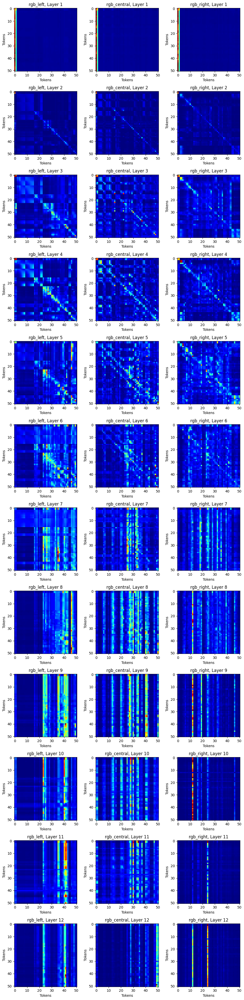

In [182]:
plot_attention_weights(attn_weights)

### Average the last 3 layers

In [183]:
# Get the last 3 layers
last_attn_weights = attn_weights[-3:]  # list of 3 tensors [3, 51, 51]
# Each is of shape [3, 51, 51], so average w.r.t. the layers, not the cameras
last_attn_weights = torch.stack(last_attn_weights, dim=0)  # [3, 3, 51, 51]
# Average all the layers
last_attn_weights = last_attn_weights.mean(dim=0)  # [3, 51, 51]
# Do a min-max normalization per camera
for c in range(last_attn_weights.shape[0]):
    last_attn_weights[c] = (last_attn_weights[c] - last_attn_weights[c].min()) / (last_attn_weights[c].max() - last_attn_weights[c].min())
# Extract the attention weights for the special tokens
last_attn_weights_tokens = last_attn_weights[:, model.act_tokens_pos, -model.tfx_num_patches:]  # [3, 2, 49]  or [3, C, M]
# Flatten the last dim only
last_attn_weights_tokens = last_attn_weights_tokens.view(3, 2, 7, 7)  # [3, 2, 7, 7]  or [3, C, N, N]

In [184]:
# Get the attention weights for the patches
last_attn_weights_patches = last_attn_weights[:, -model.tfx_num_patches:, -model.tfx_num_patches:]  # [3, 49, 49] or [3, M, M]
# Flatten the last two dimensions
last_attn_weights_patches = last_attn_weights_patches.view(3, 7, 7, 7, 7)  # [3, 7, 7, 7, 7] or [3, N, N, N ,N]

In [185]:
last_attn_weights_patches.shape

torch.Size([3, 7, 7, 7, 7])

In [186]:
# Refinement step: matrix multiply the attention weights for the patches with the attention weights for the tokens
last_attn_weights_refinement = torch.einsum('bcij,bijkl->bcij', last_attn_weights_tokens, last_attn_weights_patches)  # [3, 2, 7, 7] or [3, C, N, N]

In [187]:
att_weights_steering_refined = last_attn_weights_refinement[:, 0, :]
att_weights_accel_refined = last_attn_weights_refinement[:, 1, :]

In [188]:
last_attn_weights_refinement.shape

torch.Size([3, 2, 7, 7])

In [189]:
from typing import List, Union

def get_refined_attention_maps(att_map: List[torch.Tensor], 
                               layers: Union[int, List[int]] = 1) -> torch.Tensor:
    """ Get the refined attention maps using the patch-to-patch attention weights w.r.t. the selected layers.
        layers can be either an int (so then the last layers) or a list of ints """
    # Get the last k layers
    if isinstance(layers, int):
        last_attn_weights = att_map[-layers:]  # list of K tensors [3, 51, 51]
    elif isinstance(layers, list):
        last_attn_weights = [att_map[l] for l in layers]
    # Each is of shape [3, 51, 51], so average w.r.t. the layers, not the cameras
    last_attn_weights = torch.stack(last_attn_weights, dim=0)  # [K, 3, 51, 51]
    # Average all the layers
    last_attn_weights = last_attn_weights.mean(dim=0)  # [3, 51, 51]
    # Do a min-max normalization per camera
    for c in range(last_attn_weights.shape[0]):
        last_attn_weights[c] = (last_attn_weights[c] - last_attn_weights[c].min()) / (last_attn_weights[c].max() - last_attn_weights[c].min())
    # Extract the attention weights for the special tokens
    last_attn_weights_tokens = last_attn_weights[:, 
                                                 model.act_tokens_pos, 
                                                 -model.tfx_num_patches:]  # [3, 2, 49]  or [3, C, M]
    # Flatten the last dim only
    last_attn_weights_tokens = last_attn_weights_tokens.view(3, 2, 7, 7)  # [3, 2, 7, 7]  or [3, C, N, N]

    # Get the attention weights for the patches
    last_attn_weights_patches = last_attn_weights[:, 
                                                  -model.tfx_num_patches:, 
                                                  -model.tfx_num_patches:]  # [3, 49, 49] or [3, M, M]
    # Flatten the last two dimensions
    last_attn_weights_patches = last_attn_weights_patches.view(3, 7, 7, 7, 7)  # [3, 7, 7, 7, 7] or [3, N, N, N ,N]

    # Refinement step: matrix multiply the attention weights for the patches with the attention weights for the tokens
    last_attn_weights_refinement = torch.einsum('bcij,bijkl->bcij', 
                                                last_attn_weights_tokens, 
                                                last_attn_weights_patches)  # [3, 2, 7, 7] or [3, C, N, N]

    return last_attn_weights_refinement
    

In [190]:
from typing import List
import cv2

def plot_attentions_views(attn_token: List[torch.Tensor], name: str, top: float = 0.9):
    """ For each of the 3 cameras, plot the attention weights for the steering and acceleration tokens 
    on top of them with a transparency"""
    # We want 3 columns (one for each camera) and 12 rows (one for each layer)
    num_layers = len(attn_token)
    num_cameras = len(attn_token[0])
    r = num_layers / num_cameras
    cameras_dict = {0: 'rgb_left', 1: 'rgb_central', 2: 'rgb_right'}

    fig, axs = plt.subplots(num_layers, num_cameras, figsize=(10, 10 * r))
    for layer in range(num_layers):
        for c in range(num_cameras):
            at = attn_token[layer][c].detach().numpy()
            img = img_paths_dict[cameras_dict[c]][0]
            # Resize to image size
            at = cv2.resize(at, img.size)
            if num_layers == 1:
                axs[c].imshow(img)
                axs[c].imshow(at, cmap='jet', alpha=0.5)
                axs[c].set_title(f'{cameras_dict[c]}')
            else:
                axs[layer, c].imshow(img)
                axs[layer, c].imshow(at, cmap='jet', alpha=0.5)
                axs[layer, c].set_title(f'{cameras_dict[c]}, Layer {layer+1}')

    plt.tight_layout(rect=[0, 0.03, 1, top])
    # Turn off all ticks
    for ax in axs.flat:
        ax.set_xticks([])
        ax.set_yticks([])
    # Set title for the whole plot
    fig.suptitle(f'Attention Weights for {name} Tokens', fontsize=16)
    plt.show()

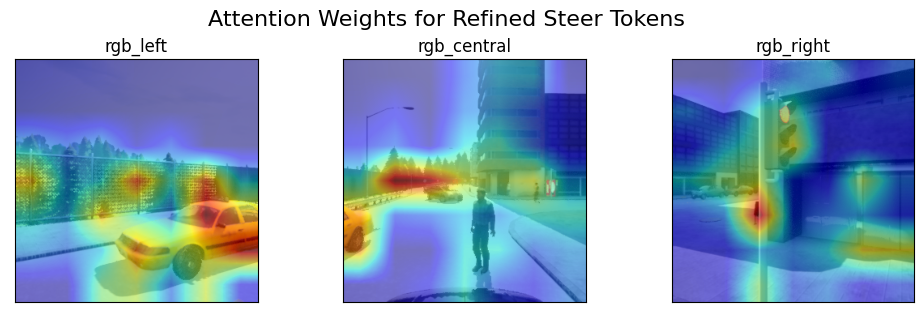

In [191]:
attn_ref = get_refined_attention_maps(attn_weights, layers=[0,1,2,3,4,5])

att_weights_steering_refined = attn_ref[:, 0]
att_weights_accel_refined = attn_ref[:, 1]

plot_attentions_views([att_weights_steering_refined], 'Refined Steer')

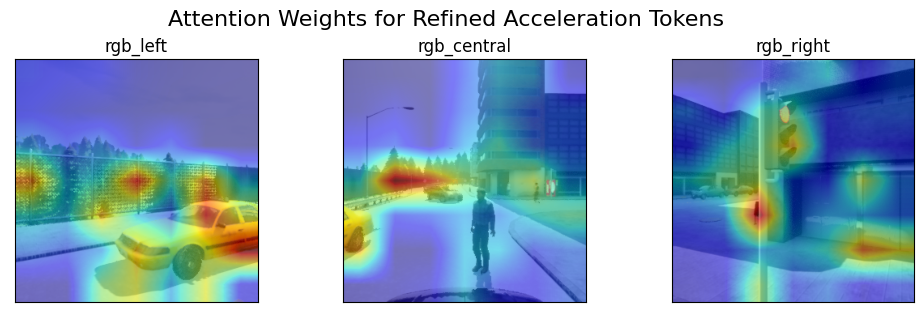

In [192]:
plot_attentions_views([att_weights_accel_refined], 'Refined Acceleration')

In [193]:
# Let's extract only the attention weights for the patches (per token)
attn_weights_patches = [attn_weights[layer][:, model.act_tokens_pos, -model.tfx_num_patches:] for layer in range(len(attn_weights))]

In [194]:
# Remember that the first token is the [STR] and the second is the [ACC]
attn_weights_steering = [attn_weights_patches[layer][:, 0, :] for layer in range(len(attn_weights))]
attn_weights_acceleration = [attn_weights_patches[layer][:, 1, :] for layer in range(len(attn_weights))]

# Reshape each attention weight in each camera to a 2D image
attn_weights_steering = [attn_weights_steering[layer].reshape(cam, 7, 7) for layer in range(len(attn_weights))]
attn_weights_acceleration = [attn_weights_acceleration[layer].reshape(cam, 7, 7) for layer in range(len(attn_weights))]

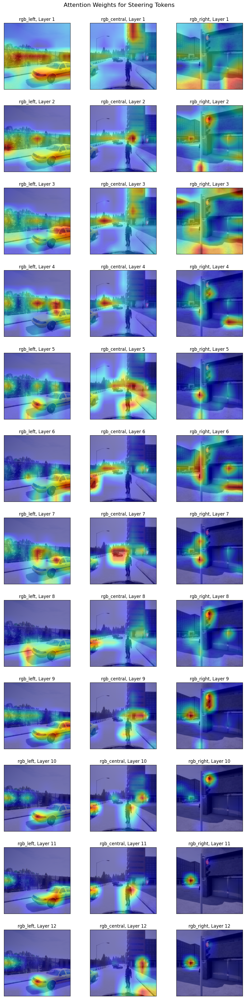

In [195]:
plot_attentions_views(attn_weights_steering, 'Steering', top=0.97)

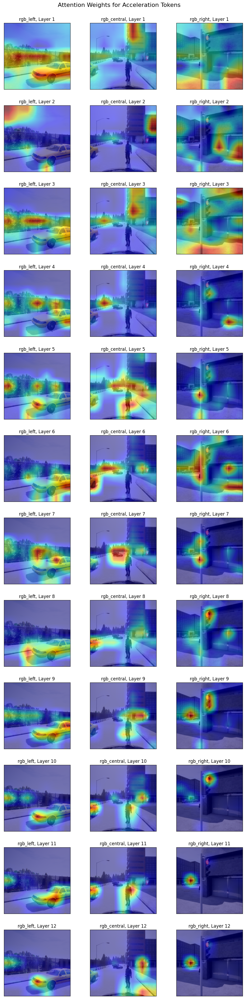

In [196]:
plot_attentions_views(attn_weights_acceleration, 'Acceleration', top=0.97)

## Get the Relevance Maps

From Chefer et.al. 2021: https://openaccess.thecvf.com/content/CVPR2021/papers/Chefer_Transformer_Interpretability_Beyond_Attention_Visualization_CVPR_2021_paper.pdf

$$ \mathbf{\overline{A}}^{(b)} = \mathit{I} + \mathbb{E}_{h} \left[ (\nabla \mathbf{A}^{(b)} \odot \mathbf{A} )^{+}\right]$$

Their code will be our guide, concretely: https://github.com/hila-chefer/RobustViT/blob/master/ViT/explainer.py

In [209]:
model.zero_grad()

In [198]:
num_tokens = model.tfx_seq_length

R = torch.eye(num_tokens, num_tokens)
R = R.unsqueeze(0).expand(1, num_tokens, num_tokens)  # [B, N, N]

In [210]:
wut = torch.autograd.grad(action_output.squeeze()[0], in_memory, retain_graph=True)

In [211]:
wut[0].shape

torch.Size([1, 4608])

In [204]:
torch.autograd.grad(action_output.squeeze()[0], attn_weights[-1], retain_graph=True, allow_unused=True)[0].shape


AttributeError: 'NoneType' object has no attribute 'shape'

In [215]:
attn_weights[-1].grad_fn

AttributeError: 'DivBackward0' object has no attribute '_saved_result'